In [13]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

# Visualizacion de Datos
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
data = pd.read_csv('../../../proyecto-final-datascience/SpotifySongs/tracks.csv')
data.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [15]:
data.shape

(299998, 20)

In [16]:
data.count()

id                  299998
name                299997
popularity          299998
duration_ms         299998
explicit            299998
artists             299998
id_artists          299998
release_date        299998
danceability        299998
energy              299998
key                 299998
loudness            299998
mode                299998
speechiness         299998
acousticness        299998
instrumentalness    299998
liveness            299998
valence             299998
tempo               299998
time_signature      299998
dtype: int64

In [17]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,299998.0,27.659304,20.105595,0.0,9.0000,28.000000,42.0000,100.000
duration_ms,299998.0,231526.950436,129527.562162,3344.0,173467.0000,212779.500000,263907.0000,5042185.000
explicit,299998.0,0.039300,0.194309,0.0,0.0000,0.000000,0.0000,1.000
danceability,299998.0,0.556669,0.168765,0.0,0.4430,0.570000,0.6820,0.988
energy,299998.0,0.519285,0.256403,0.0,0.3120,0.521000,0.7280,1.000
key,299998.0,5.213075,3.518186,0.0,2.0000,5.000000,8.0000,11.000
loudness,299998.0,-10.659223,5.260261,-60.0,-13.4410,-9.730000,-6.7810,5.109
mode,299998.0,0.663138,0.472638,0.0,0.0000,1.000000,1.0000,1.000
speechiness,299998.0,0.093689,0.160622,0.0,0.0341,0.043700,0.0704,0.970
acousticness,299998.0,0.476738,0.356805,0.0,0.1100,0.473000,0.8260,0.996


In [18]:
#Data Profiling
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

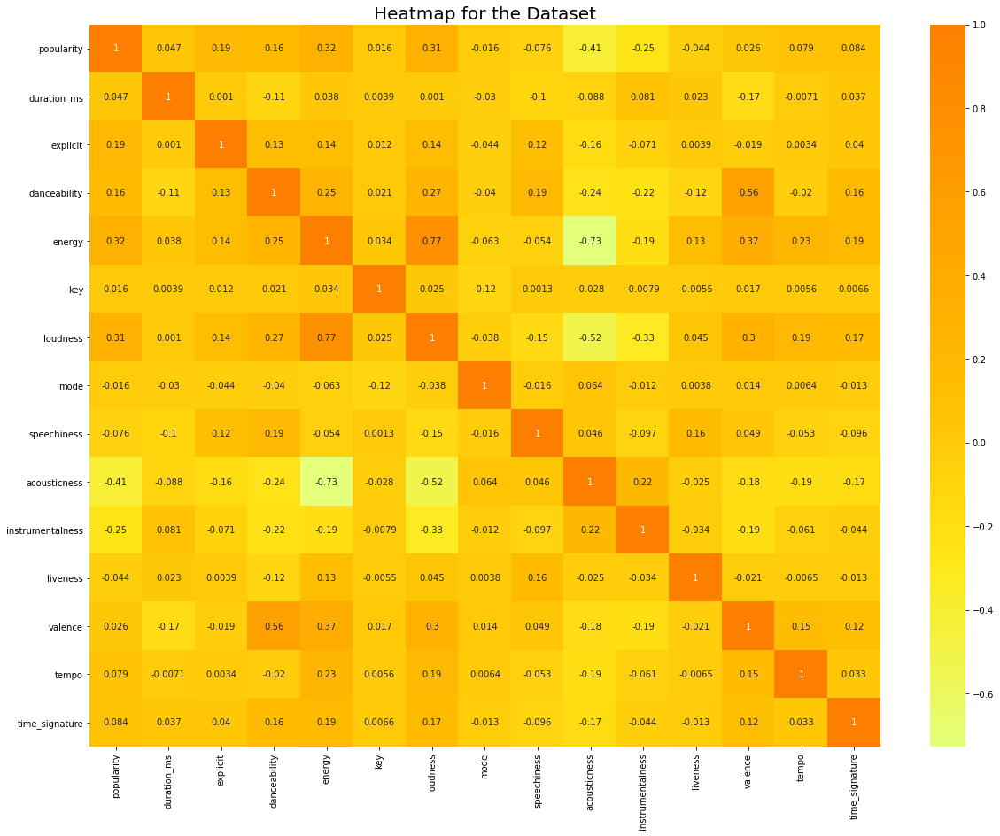

In [19]:
#Hagamos un HeatMap del df
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (20, 15)
    sns.heatmap(data.corr(), annot = True, cmap = 'Wistia')
    plt.title('Heatmap for the Dataset', fontsize = 20)
    plt.show()

Some of the audio features that describe songs/tracks are:

Loudness: Volumen
Popularity: Cuan popular es el tema
Acousticness: Whether the song/track is acoustic or not.
Tempo: The tempo of the song/track, measured in beats per minute (BPM).
Energy: How energetic the song/track is.
Liveness: Whether a live audience is present or the song/track is studio recorded.
Valence: How positive the the music is.

Voy a elegir las variables mas fuertemente relacionadas segun el heat map: Popularity vs loudness (0.33) // Valence vs danceability (0.53) // Loudness vs energy (0.73)

### El idioma o todo en español o todo en inglés. Para el curso, hagámoslo en español. Luego podrán traducirlo

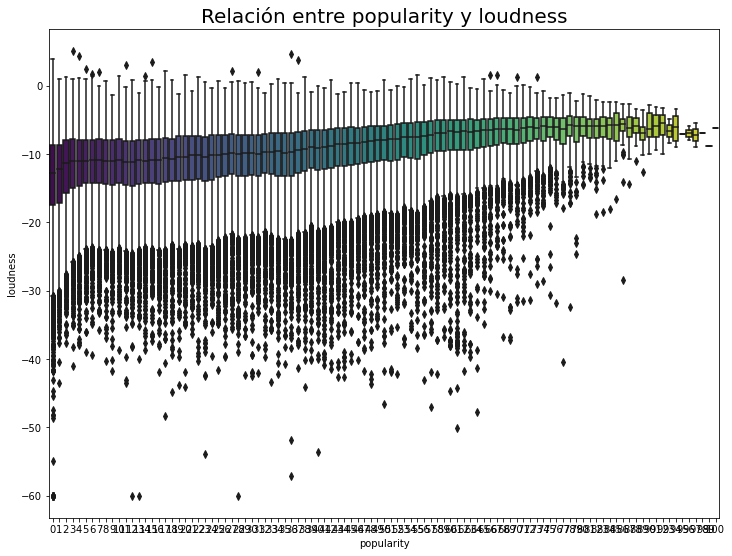

In [20]:
# popularity vs loudness
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.boxplot(x='popularity', y='loudness', data=data, palette = 'viridis')
    plt.title('Relación entre popularity y loudness', fontsize = 20)
    plt.show()

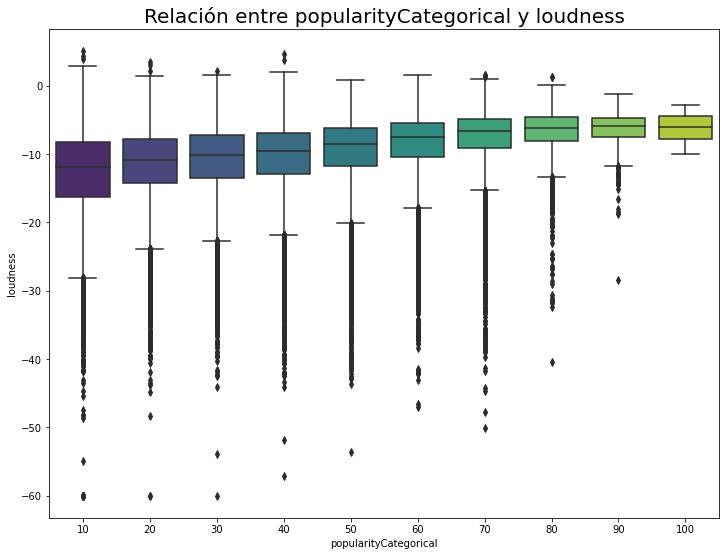

In [21]:
def f(row):
    if row['popularity'] < 10:
        val = 10
    elif row['popularity'] < 20:
        val = 20
    elif row['popularity'] < 30:
        val = 30
    elif row['popularity'] < 40:
        val = 40
    elif row['popularity'] < 50:
        val = 50
    elif row['popularity'] < 60:
        val = 60
    elif row['popularity'] < 70:
        val = 70
    elif row['popularity'] < 80:
        val = 80
    elif row['popularity'] < 90:
        val = 90
    else:
        val = 100
    return val

data['popularityCategorical'] = data.apply(f, axis=1)
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.boxplot(x='popularityCategorical', y='loudness', data=data, palette = 'viridis')
    plt.title('Relación entre popularityCategorical y loudness', fontsize = 20)
    plt.show()

La ultima grafica nos sugiere que a medida que aumenta la popularidad de las canciones, la mayoría de estas estan en un rango acotado de loudness que va entre -7 y -12. Podemos decir que los temas mejor puntuados estan en ese rango de loudness y son los preferidos de las personas.

#### Es interesante que loudness se relacione con la popularidad de esa manera habría que ver si se tiene más información de qué unidad de medida tiene esa columna ya que mayormente son negativos

In [24]:
data.loudness.describe()

count    299998.000000
mean        -10.659223
std           5.260261
min         -60.000000
25%         -13.441000
50%          -9.730000
75%          -6.781000
max           5.109000
Name: loudness, dtype: float64

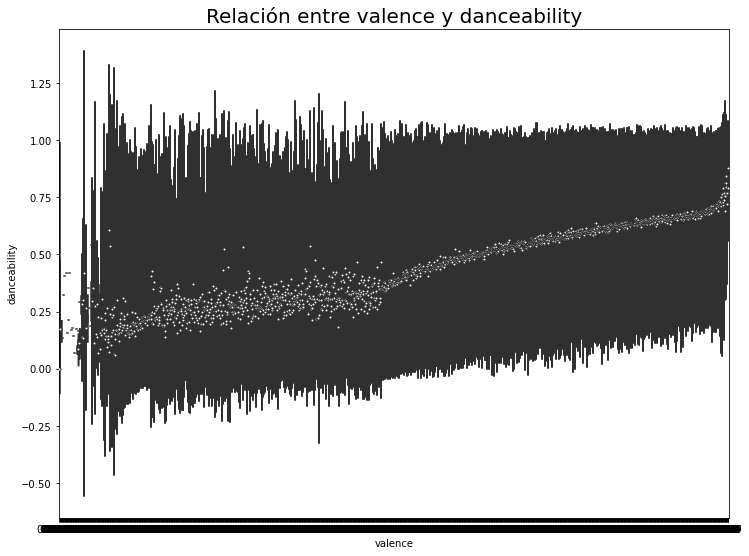

In [30]:
'''# Valence vs danceability
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.violinplot(x='valenceCategorical', y='danceability', data=data, palette= 'colorblind')
    plt.title('Relación entre valence y danceability', fontsize = 20, fontweight = 30)
    plt.show()
    
    Esto se rompe, ojo. Imagino que esta es la version sin categorizar asi que deberia quedar asi
    '''

with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.violinplot(x='valence', y='danceability', data=data, palette= 'colorblind')
    plt.title('Relación entre valence y danceability', fontsize = 20, fontweight = 30)
    plt.show()

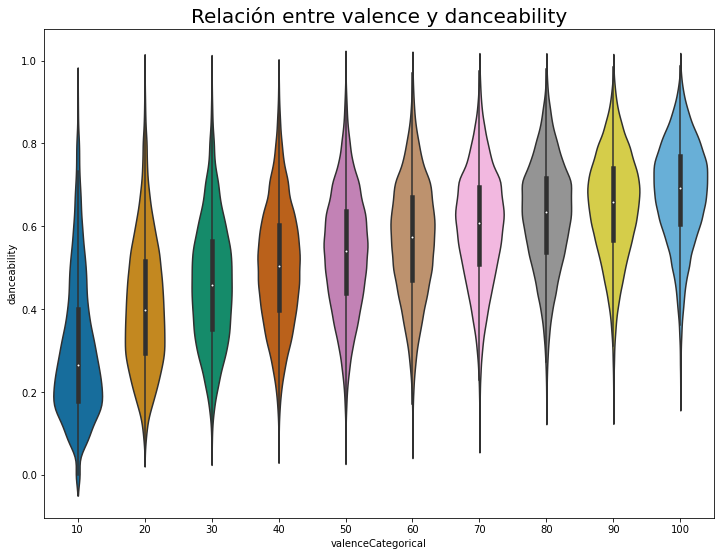

In [28]:
def valenceGroup(row):
    if row['valence'] < 0.1:
        val = 10
    elif row['valence'] < 0.2:
        val = 20
    elif row['valence'] < 0.3:
        val = 30
    elif row['valence'] < 0.4:
        val = 40
    elif row['valence'] < 0.5:
        val = 50
    elif row['valence'] < 0.6:
        val = 60
    elif row['valence'] < 0.7:
        val = 70
    elif row['valence'] < 0.8:
        val = 80
    elif row['valence'] < 0.9:
        val = 90
    else:
        val = 100
    return val

data['valenceCategorical'] = data.apply(valenceGroup, axis=1)
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.violinplot(x='valenceCategorical', y='danceability', data=data, palette= 'colorblind')
    plt.title('Relación entre valence y danceability', fontsize = 20, fontweight = 30)
    plt.show()

La ultima grafica nos sugiere que a medida que aumenta la positividad de las canciones, todas estas son mucho mas bailables (Se concentra la mayoria entre 0.6 y 0.8 de danceability)

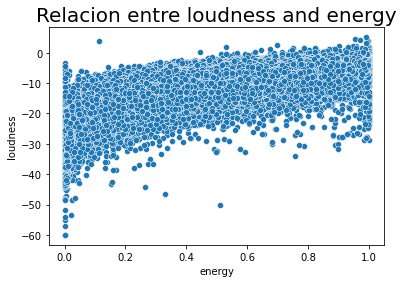

In [29]:
#Loudness vs energy
with plt.rc_context({'figure.facecolor':'white'}):
    sns.scatterplot(x="energy", y="loudness", data=data)
    plt.title('Relacion entre loudness and energy', fontsize = 20, fontweight = 30)

Algo parecido a los dos analisis anteriores, mientras mas energica la canción, la mayoria se situa en un loudness cercano a cero (-7 a -18)

In [ ]:
#Hay una relación visible ahi pero no es lineal. Habría que investigar más. Acá un ejemplo de si pasas energy a logaritmo

/home/matias.souto/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


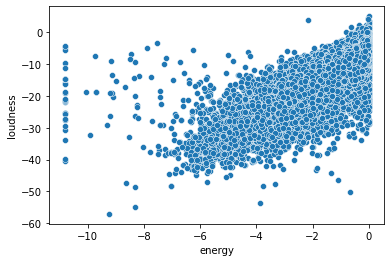

In [55]:
log_energy= np.log(data.energy)
sns.scatterplot(x=log_energy[log_energy> -8], y=data['loudness'])
plt.show()

299789
209


/home/matias.souto/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


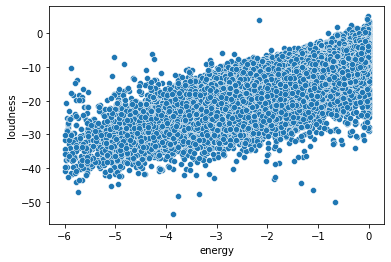

In [58]:
print((log_energy > -6).sum())
print((log_energy < -6).sum())

log_energy= np.log(data.energy)
sns.scatterplot(x=log_energy[log_energy> -6], y=data['loudness'])
plt.show()